In [1]:
import os
import re
import random
import warnings
import subprocess
from pathlib import Path

import numpy as np
import pandas as pd

import torch
import torchaudio
import matplotlib.pyplot as plt

import tqdm
import scipy.linalg

from sklearn.cluster import KMeans, SpectralClustering
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.mixture import GaussianMixture

from IPython.display import Audio, display

from ae_ideal.DataPreprocessor import DataPreprocessor


In [2]:
def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

set_seed(42)

device = "cuda" if torch.cuda.is_available() else "mps" if torch.mps.is_available() else "cpu"
print("device:", device)

ESC_ROOT = Path("data/ESC-50-master")
META_CSV = ESC_ROOT / "meta" / "esc50.csv"
AUDIO_DIR = ESC_ROOT / "audio"

ARTIFACT_DIR = Path("visualize")
ARTIFACT_DIR.mkdir(parents=True, exist_ok=True)

to_latent = DataPreprocessor().to_latent


device: mps


In [3]:
def get_git_info():
    info = {"branch": "unknown", "sha": "unknown", "dirty": False}
    try:
        info["branch"] = subprocess.check_output(["git", "rev-parse", "--abbrev-ref", "HEAD"]).decode().strip()
        info["sha"] = subprocess.check_output(["git", "rev-parse", "--short", "HEAD"]).decode().strip()
        status = subprocess.check_output(["git", "status", "--porcelain"]).decode().strip()
        info["dirty"] = (len(status) > 0)
    except Exception as e:
        print(f"Warning: git detection failed: {e}")
    return info

GIT = get_git_info()
print("git:", GIT)

AUTOENCODER_TYPE_BY_BRANCH = {"master": "normal"}
autoencoder_type = os.environ.get("AUTOENCODER_TYPE", AUTOENCODER_TYPE_BY_BRANCH.get(GIT["branch"], "noise"))
if autoencoder_type not in ("normal", "noise"):
    raise ValueError(f"autoencoder_type must be 'normal' or 'noise', got {autoencoder_type}")
print("autoencoder_type:", autoencoder_type)


git: {'branch': 'disturbed_latent', 'sha': '5cf1a9d', 'dirty': True}
autoencoder_type: noise


In [4]:
# 论文/既有风格要求：tab10 + 固定 markers
TAB10 = plt.get_cmap("tab10").colors
markers = ['o', '^', 's', 'D', 'P', 'X', '*', 'v', '<', '>']

plt.rcParams.update({
    "font.size": 10,
    "axes.labelsize": 12,
    "axes.titlesize": 13,
    "legend.fontsize": 10,
})

def safe_name(s: str) -> str:
    return re.sub(r"[^A-Za-z0-9._-]+", "-", str(s))

def estimator_name(obj) -> str:
    return obj.__class__.__name__

def run_prefix(projector, clusterer, extra_tag: str = None):
    parts = [
        autoencoder_type,
        GIT.get("branch", "unknown"),
        GIT.get("sha", "unknown"),
        estimator_name(projector),
        estimator_name(clusterer),
    ]
    if extra_tag:
        parts.append(extra_tag)
    return "-".join(safe_name(p) for p in parts)

def savefig_pdf(fig, path: Path, dpi=300):
    path.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(path, dpi=dpi, bbox_inches="tight", pad_inches=0.1)

def save_csv(df: pd.DataFrame, path: Path):
    path.parent.mkdir(parents=True, exist_ok=True)
    df.to_csv(path, index=False)


In [5]:
@torch.no_grad()
def build_latent_table_batched(
    meta_csv_path=META_CSV,
    audio_dir=AUDIO_DIR,
    batch_size=128,
    num_workers=0,
    limit=None,
    pad_value=0.0,
):
    meta = pd.read_csv(meta_csv_path)
    if "filename" not in meta.columns or "category" not in meta.columns:
        raise ValueError(f"meta csv columns: {list(meta.columns)} (need filename/category)")

    if limit is not None:
        meta = meta.iloc[:limit].copy()

    class _DS(torch.utils.data.Dataset):
        def __init__(self, meta_df, audio_dir):
            self.meta = meta_df.reset_index(drop=True)
            self.audio_dir = Path(audio_dir)

        def __len__(self):
            return len(self.meta)

        def __getitem__(self, i):
            row = self.meta.iloc[i]
            fn = row["filename"]
            label = row["category"]
            path = self.audio_dir / fn

            wav, sr = torchaudio.load(path)  # (C,T)
            if wav.ndim == 2 and wav.shape[0] > 1:
                wav = wav.mean(0, keepdim=True)  # mono (1,T)
            return wav, str(path), label

    def _collate(batch):
        wavs, paths, labels = zip(*batch)
        max_len = max(w.shape[-1] for w in wavs)
        ww = []
        for w in wavs:
            if w.shape[-1] < max_len:
                pad = torch.full((w.shape[0], max_len - w.shape[-1]), pad_value, dtype=w.dtype)
                w = torch.cat([w, pad], dim=-1)
            else:
                w = w[..., :max_len]
            ww.append(w)
        ww = torch.stack(ww, dim=0)  # (B,1,T)
        return ww, list(paths), list(labels)

    ds = _DS(meta, audio_dir)
    dl = torch.utils.data.DataLoader(
        ds, batch_size=batch_size, shuffle=False,
        num_workers=num_workers, collate_fn=_collate, pin_memory=False
    )

    all_paths, all_labels, all_latents = [], [], []

    with torch.inference_mode():
        for wav_batch, paths, labels in tqdm.tqdm(dl):
            wav_batch = wav_batch.to(device)
            try:
                z = to_latent(wav_batch)
            except Exception:
                z = to_latent(wav_batch.squeeze(1))

            z = torch.as_tensor(z)
            if z.ndim == 1:
                z = z.unsqueeze(0)
            z = z.reshape(z.shape[0], -1).detach().cpu().numpy()

            all_latents.append(z)
            all_paths.extend(paths)
            all_labels.extend(labels)

    X_300d = np.concatenate(all_latents, axis=0)
    y = np.array(all_labels)

    latent_df = pd.DataFrame({"path": all_paths, "original_label": y.tolist()})
    return latent_df, X_300d, y


In [6]:
def project_2d(projector, X_300d: np.ndarray) -> np.ndarray:
    X_300d = np.asarray(X_300d)
    if hasattr(projector, "fit_transform"):
        return projector.fit_transform(X_300d)
    projector.fit(X_300d)
    return projector.transform(X_300d)

def fit_clusterer(clusterer, X2d: np.ndarray):
    clusterer.fit(X2d)
    if hasattr(clusterer, "predict"):
        labels = clusterer.predict(X2d)
    else:
        labels = clusterer.labels_
    return labels

def cluster_masses(clusterer):
    if hasattr(clusterer, "means_"):  # GMM
        return np.asarray(clusterer.means_)
    if hasattr(clusterer, "cluster_centers_"):  # KMeans
        return np.asarray(clusterer.cluster_centers_)
    return None

def distances_to_assigned_mass(X2d: np.ndarray, labels: np.ndarray, masses: np.ndarray) -> np.ndarray:
    return np.linalg.norm(X2d - masses[labels], axis=1)

def soft_confidence_from_distances(dist_all: np.ndarray, temperature: float = 1.0) -> np.ndarray:
    # dist_all: (N,K) -> confidence per sample = max softmax(-dist/t)
    z = -dist_all / max(temperature, 1e-6)
    z = z - z.max(axis=1, keepdims=True)
    expz = np.exp(z)
    p = expz / expz.sum(axis=1, keepdims=True)
    return p

def cluster_confidence(clusterer, X2d: np.ndarray, temperature: float = 1.0):
    # returns (p, confidence, margin) where p shape (N,K) if available
    if hasattr(clusterer, "predict_proba"):
        p = clusterer.predict_proba(X2d)
        conf = p.max(axis=1)
        if p.shape[1] == 2:
            margin = np.abs(p[:, 1] - p[:, 0])
        else:
            ps = np.sort(p, axis=1)
            margin = ps[:, -1] - ps[:, -2]
        return p, conf, margin

    # KMeans: use distances to centers -> softmax(-dist/t)
    masses = cluster_masses(clusterer)
    if masses is None:
        return None, None, None
    dist_all = np.linalg.norm(X2d[:, None, :] - masses[None, :, :], axis=2)  # (N,K)
    p = soft_confidence_from_distances(dist_all, temperature=temperature)
    conf = p.max(axis=1)
    if p.shape[1] == 2:
        margin = np.abs(p[:, 1] - p[:, 0])
    else:
        ps = np.sort(p, axis=1)
        margin = ps[:, -1] - ps[:, -2]
    return p, conf, margin


In [7]:
def scatter_by_label(X2d: np.ndarray, labels, title=None, figsize=(7.5, 6.5), save_path: Path = None):
    X2d = np.asarray(X2d)
    labels = np.asarray(labels)

    uniq = np.unique(labels)
    fig, ax = plt.subplots(figsize=figsize)

    m = len(markers)
    c = len(TAB10)  # tab10=10

    for i, lab in enumerate(uniq):
        idx = (labels == lab)

        marker = markers[i % m]
        color  = TAB10[(i // m) % c]   # 关键：笛卡尔积组合

        ax.scatter(X2d[idx, 0], X2d[idx, 1],
                   s=16, alpha=0.85, c=[color], marker=marker, label=str(lab))

    ax.grid(True, linestyle="--", linewidth=0.5, alpha=0.5)
    ax.set_xlabel("dim-1")
    ax.set_ylabel("dim-2")
    if title:
        ax.set_title(title)

    ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.12),
              ncol=min(5, len(uniq)), borderaxespad=0.0, frameon=False,
              columnspacing=1.0, handletextpad=0.5)

    fig.tight_layout()
    if save_path is not None:
        savefig_pdf(fig, save_path)
    return fig, ax

from sklearn.neighbors import KNeighborsClassifier

def overlay_cluster_boundary(ax, clusterer, X2d: np.ndarray, grid_n=280):
    # 1. 创建网格
    x_min, x_max = X2d[:, 0].min() - 1, X2d[:, 0].max() + 1
    y_min, y_max = X2d[:, 1].min() - 1, X2d[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, grid_n), np.linspace(y_min, y_max, grid_n))
    grid = np.c_[xx.ravel(), yy.ravel()]

    # 2. 预测网格点的标签
    if hasattr(clusterer, "predict"):
        # 情况 A: KMeans, GMM 等自带 predict 的算法
        zz = clusterer.predict(grid).reshape(xx.shape)
    else:
        # 情况 B: SpectralClustering, DBSCAN 等没有 predict 的算法
        # 解决方案：训练一个 KNN 来“模仿”聚类结果的边界
        
        # 确保聚类器已经训练过并且有标签
        if not hasattr(clusterer, "labels_"):
            return # 如果还没 fit 过，直接返回，不画边界
            
        y_pred = clusterer.labels_
        
        # 过滤掉噪声点 (DBSCAN产生 -1)
        mask = y_pred != -1
        if np.sum(mask) == 0:
            return 
            
        # 使用 KNN 拟合边界 (n_neighbors 越小边界越锯齿，越大越平滑)
        knn = KNeighborsClassifier(n_neighbors=5)
        knn.fit(X2d[mask], y_pred[mask])
        zz = knn.predict(grid).reshape(xx.shape)

    # 3. 绘制轮廓线
    # levels 需要根据类别数调整，这里简单处理
    ax.contour(xx, yy, zz, alpha=0.45, linewidths=1, colors='purple')

In [8]:
# def build_out_df(
#     latent_df: pd.DataFrame,
#     X2d: np.ndarray,
#     cluster_labels: np.ndarray,
#     clusterer,
#     temperature: float = 1.0,
# ):
#     out_df = latent_df.copy()
#     out_df["x"] = X2d[:, 0]
#     out_df["y"] = X2d[:, 1]
#     out_df["cluster"] = cluster_labels

#     masses = cluster_masses(clusterer)
#     if masses is None:
#         raise ValueError(f"clusterer {estimator_name(clusterer)} has no masses (means_/cluster_centers_)")

#     out_df["dist_to_mass"] = distances_to_assigned_mass(X2d, cluster_labels, masses)

#     p, conf, margin = cluster_confidence(clusterer, X2d, temperature=temperature)
#     if p is not None:
#         out_df["confidence"] = conf
#         out_df["margin"] = margin
#         if p.shape[1] >= 2:
#             out_df["p0"] = p[:, 0]
#             out_df["p1"] = p[:, 1]
#     else:
#         out_df["confidence"] = np.nan
#         out_df["margin"] = np.nan

#     return out_df

from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import SpectralClustering

# --- 1. 新增：计算样本到“流形骨架”的距离 (基于局部密度) ---
def compute_manifold_distance(X: np.ndarray, labels: np.ndarray, n_neighbors=5) -> np.ndarray:
    """
    计算每个样本到其所属簇的'核心区域'的距离。
    使用 KNN 距离：点越稀疏（边缘），到邻居的平均距离越大；点越密集（核心），距离越小。
    这完美替代了非凸形状下的'质心距离'。
    """
    dists = np.zeros(len(X))
    unique_labels = np.unique(labels)
    
    for label in unique_labels:
        if label == -1: # 处理噪声点
            dists[labels == label] = np.inf
            continue
            
        # 提取当前簇的数据
        mask = (labels == label)
        X_cluster = X[mask]
        
        if len(X_cluster) < n_neighbors:
            dists[mask] = 0 # 簇太小，忽略
            continue

        # 寻找最近的 n 个邻居 (排除自己)
        nbrs = NearestNeighbors(n_neighbors=n_neighbors + 1).fit(X_cluster)
        distances, _ = nbrs.kneighbors(X_cluster)
        
        # 取平均距离作为“离群程度” (第0列是自己，距离为0，所以取 1:)
        # 距离越小 = 越典型的样本 (Mass center)
        mean_dists = distances[:, 1:].mean(axis=1)
        dists[mask] = mean_dists
        
    return dists

# --- 2. 覆盖：重写 build_out_df 以支持无质心的聚类 ---
def build_out_df(
    latent_df: pd.DataFrame,
    X2d: np.ndarray,
    cluster_labels: np.ndarray,
    clusterer,
    temperature: float = 1.0,
):
    out_df = latent_df.copy()
    out_df["x"] = X2d[:, 0]
    out_df["y"] = X2d[:, 1]
    out_df["cluster"] = cluster_labels

    # 尝试获取质心
    masses = cluster_masses(clusterer)
    
    if masses is not None:
        # 情况 A: KMeans / GMM (凸形状，有质心)
        out_df["dist_to_mass"] = distances_to_assigned_mass(X2d, cluster_labels, masses)
        # 计算置信度 (原有逻辑)
        p, conf, margin = cluster_confidence(clusterer, X2d, temperature=temperature)
    else:
        # 情况 B: Spectral / DBSCAN (非凸形状，无质心)
        # 使用流形密度距离代替质心距离
        print(f"Clusterer {estimator_name(clusterer)} has no centroids. Using manifold density distance.")
        out_df["dist_to_mass"] = compute_manifold_distance(X2d, cluster_labels, n_neighbors=10)
        
        # 对于谱聚类，很难计算基于概率的 confidence，这里暂时填 NaN 或基于距离归一化
        # 这里简单处理：距离越小 confidence 越高
        # 归一化 dist_to_mass 到 0-1 之间作为简单的 confidence proxy
        d = out_df["dist_to_mass"].values
        # 避免除以0
        if d.max() > d.min():
            norm_d = (d - d.min()) / (d.max() - d.min())
            out_df["confidence"] = 1.0 - norm_d # 越近越自信
        else:
            out_df["confidence"] = 1.0
            
        out_df["margin"] = np.nan
        out_df["p0"] = np.nan
        out_df["p1"] = np.nan

    return out_df



In [9]:
def select_topN_by_mass(out_df: pd.DataFrame, cluster_id: int, n: int = 10, smallest=True):
    d = out_df[out_df["cluster"] == cluster_id].copy()
    d = d.sort_values("dist_to_mass", ascending=smallest).head(n).reset_index(drop=True)
    return d

def select_topN_by_mass_all_clusters(out_df: pd.DataFrame, n: int = 10, smallest=True):
    res = []
    for c in sorted(out_df["cluster"].unique()):
        res.append(select_topN_by_mass(out_df, c, n=n, smallest=smallest))
    return res


In [10]:
@torch.no_grad()
def plot_topN_logmel(
    out_df: pd.DataFrame,
    mel_transform,
    cluster_id=0,
    n=10,
    n_cols=5,
    figsize=(14, 6),
    title_prefix="TopN (closest to mass) log-mel",
):
    d = select_topN_by_mass(out_df, cluster_id=cluster_id, n=n, smallest=True)

    n_rows = int(np.ceil(n / n_cols))
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = np.array(axes).reshape(-1)

    for i, r in enumerate(d.itertuples(index=False)):
        ax = axes[i]
        wav, sr = torchaudio.load(r.path)
        if wav.ndim == 2 and wav.shape[0] > 1:
            wav = wav.mean(0, keepdim=True)

        wav = wav.to(device)
        mel = mel_transform(wav).squeeze(0).detach().cpu().numpy()  # (n_mels,T)

        ax.imshow(mel, origin="lower", aspect="auto")
        ax.set_xticks([])
        ax.set_yticks([])

        title = f"{Path(r.path).name}\n{r.original_label} | d={r.dist_to_mass:.3f}"
        if "confidence" in d.columns and np.isfinite(r.confidence):
            title += f" | conf={r.confidence:.3f}"
        ax.set_title(title, fontsize=9)

    for j in range(i + 1, len(axes)):
        axes[j].axis("off")

    fig.suptitle(f"{title_prefix} | cluster={cluster_id}", y=1.02)
    fig.tight_layout()
    return d, fig


In [11]:
@torch.no_grad()
def compute_lowlevel_features(
    wav: torch.Tensor,
    mel_transform,
    rolloff_pct=0.85,
    silence_db=-40.0,
):
    eps = 1e-12

    if wav.ndim == 2 and wav.shape[0] > 1:
        wav = wav.mean(0, keepdim=True)
    wav_mono = wav[0] if wav.ndim == 2 else wav
    wav_mono = wav_mono.to(device)

    mel = mel_transform(wav_mono.unsqueeze(0)).squeeze(0).detach().cpu().numpy()  # (n_mels,T)
    mel_lin = np.power(10.0, mel / 10.0)

    x = wav_mono.detach().cpu().numpy()
    rms = float(np.sqrt(np.mean(x ** 2) + eps))
    peak = float(np.max(np.abs(x)) + eps)
    crest = float(peak / (rms + eps))
    zcr = float(np.mean(x[:-1] * x[1:] < 0))

    freqs = np.arange(mel_lin.shape[0], dtype=np.float32)
    spec = mel_lin + eps

    centroid = np.sum(freqs[:, None] * spec, axis=0) / np.sum(spec, axis=0)
    centroid_hz = float(np.mean(centroid))

    cumsum = np.cumsum(spec, axis=0)
    total = cumsum[-1, :]
    rolloff_bin = np.argmax(cumsum >= rolloff_pct * total[None, :], axis=0)
    rolloff_hz = float(np.mean(rolloff_bin))

    geom = np.exp(np.mean(np.log(spec), axis=0))
    arith = np.mean(spec, axis=0)
    flatness = float(np.mean(geom / (arith + eps)))

    silence_ratio = float(np.mean(mel < silence_db))

    return {
        "rms": rms,
        "crest": crest,
        "zcr": zcr,
        "centroid_hz": centroid_hz,
        "rolloff_hz": rolloff_hz,
        "flatness": flatness,
        "silence_ratio": silence_ratio,
    }

def build_feature_table(out_df: pd.DataFrame, mel_transform, subset_df: pd.DataFrame = None):
    d = out_df if subset_df is None else subset_df
    rows = []
    for r in d.itertuples(index=False):
        wav, sr = torchaudio.load(r.path)
        feats = compute_lowlevel_features(wav, mel_transform=mel_transform)
        row = {
            "path": r.path,
            "original_label": r.original_label,
            "cluster": r.cluster,
            "dist_to_mass": r.dist_to_mass,
        }
        if hasattr(r, "confidence"):
            row["confidence"] = r.confidence
        if hasattr(r, "margin"):
            row["margin"] = r.margin
        rows.append({**row, **feats})
    return pd.DataFrame(rows)

def balance_by_cluster(out_df: pd.DataFrame, n_per_cluster="min", seed=42):
    rng = np.random.default_rng(seed)
    groups = []
    uniq = sorted(out_df["cluster"].unique())
    if n_per_cluster == "min":
        target = min((out_df[out_df["cluster"] == c].shape[0] for c in uniq))
    else:
        target = int(n_per_cluster)

    for c in uniq:
        d = out_df[out_df["cluster"] == c]
        if len(d) > target:
            idx = rng.choice(d.index.values, size=target, replace=False)
            groups.append(out_df.loc[idx])
        else:
            groups.append(d)
    return pd.concat(groups, axis=0).reset_index(drop=True)

def plot_feature_boxplots(feat_df: pd.DataFrame, feature_cols=None, figsize=(24, 3.8)):
    import seaborn as sns

    if feature_cols is None:
        feature_cols = ["rms", "crest", "zcr", "centroid_hz", "rolloff_hz", "flatness", "silence_ratio"]

    d = feat_df.copy()
    d["cluster"] = d["cluster"].astype(str)   # 关键：统一为 str

    clusters = sorted(d["cluster"].unique(), key=lambda x: int(x) if x.isdigit() else x)

    palette = {c: TAB10[int(c) % 10] if c.isdigit() else TAB10[i % 10] for i, c in enumerate(clusters)}

    fig, axes = plt.subplots(1, len(feature_cols), figsize=figsize, sharey=False)
    if len(feature_cols) == 1:
        axes = [axes]

    counts = d["cluster"].value_counts().sort_index()

    for i, feat in enumerate(feature_cols):
        ax = axes[i]
        dd = d[["cluster", feat]].rename(columns={feat: "value"})
        sns.boxplot(
            data=dd,
            x="cluster",
            y="value",
            hue="cluster",          # 关键
            order=clusters,
            hue_order=clusters,
            palette=palette,
            ax=ax,
            width=0.6,
            fliersize=2,
            legend=False            # 关键：避免每个子图都画 legend
        )


        ax.set_title(feat, fontsize=11)
        ax.set_xlabel("")
        ax.set_ylabel("value" if i == 0 else "")
        ax.grid(True, linestyle="--", alpha=0.25)

    fig.suptitle(
        "Low-level features by cluster | " + "  ".join([f"c{k}={v}" for k, v in counts.items()]),
        y=1.05
    )
    fig.tight_layout()
    return fig


In [12]:
def projector_name(projector):  # 简单：类名
    return safe_name(estimator_name(projector))

def clusterer_name(clusterer):
    return safe_name(estimator_name(clusterer))

def run_experiment_once(
    projector,
    clusterer,
    latent_df: pd.DataFrame,
    X_300d: np.ndarray,
    y,
    temperature: float = 1.0,
    export_all=True,
    save_file=True,
):
    proj = projector_name(projector)
    clus = clusterer_name(clusterer)
    mode = autoencoder_type  # "normal" / "noise"

    X2d = project_2d(projector, X_300d)
    cluster_labels = fit_clusterer(clusterer, X2d)

    out_df = build_out_df(
        latent_df=latent_df,
        X2d=X2d,
        cluster_labels=cluster_labels,
        clusterer=clusterer,
        temperature=temperature,
    )

    # CSV（你没指定格式，我保留不改；如果也想改规则，告诉我）
    csv_path = ARTIFACT_DIR / f"{proj}-{clus}-{mode}.csv"
    if save_file:
        save_csv(out_df, csv_path)

    artifacts = {"csv": csv_path}

    if not export_all:
        return X2d, out_df, artifacts

    # 1) all sample plot
    fig, ax = scatter_by_label(
        X2d, y,
        title=f"{proj} all samples",
        figsize=(8, 7),
        save_path=None
    )
    p = ARTIFACT_DIR / f"{proj}-{mode}-all-sample.pdf"
    if save_file:
        savefig_pdf(fig, p)
    artifacts["all_sample"] = p

    # 2) all sample + cluster boundary
    fig, ax = scatter_by_label(
        X2d, y,
        title=f"{proj} + {clus} cluster boundary",
        figsize=(8, 7),
        save_path=None
    )
    overlay_cluster_boundary(ax, clusterer, X2d)
    p = ARTIFACT_DIR / f"{proj}-{clus}-{mode}-cluster-boundary.pdf"
    if save_file:
        savefig_pdf(fig, p)
    artifacts["cluster_boundary"] = p

    # 3) Top10 log-mel per cluster-id
    mel_t = to_latent.mel_transform.to(device).eval()
    for cid in sorted(out_df["cluster"].unique()):
        _, figm = plot_topN_logmel(out_df, mel_t, cluster_id=cid, n=10, n_cols=5, figsize=(14, 6))
        p = ARTIFACT_DIR / f"{proj}-{clus}-{mode}-cluster{cid}-top10-logmel.pdf"
        if save_file:
            savefig_pdf(figm, p)
        artifacts[f"top10_logmel_c{cid}"] = p

        # 4) Low level per cluster-id（如果你想“只看该 cluster 的分布”，就筛选 cluster）
        sub = out_df[out_df["cluster"] == cid].reset_index(drop=True)
        feat = build_feature_table(sub, mel_t)

        fig = plot_feature_boxplots(feat, figsize=(24, 3.8))
        p = ARTIFACT_DIR / f"{proj}-{clus}-{mode}-cluster{cid}-low-level.pdf"
        if save_file:
            savefig_pdf(fig, p)
        artifacts[f"low_level_c{cid}"] = p

    return X2d, out_df, artifacts


In [13]:
def make_tsne(perplexity=30, max_iter=1000, random_state=42, init="pca", learning_rate="auto"):
    return TSNE(
        n_components=2,
        perplexity=perplexity,
        max_iter=max_iter,
        random_state=random_state,
        init=init,
        learning_rate=learning_rate,
    )

def make_pca():
    return PCA(n_components=2)

def make_kmeans(n_clusters=2, random_state=42, n_init="auto"):
    return KMeans(n_clusters=n_clusters, random_state=random_state, n_init=n_init)

def make_gmm(n_components=2, covariance_type="full", random_state=42, reg_covar=1e-6):
    return GaussianMixture(
        n_components=n_components,
        covariance_type=covariance_type,
        random_state=random_state,
        reg_covar=reg_covar,
    )

def make_spectral(n_clusters=2):
    return SpectralClustering(
        n_clusters=n_clusters,
        affinity='nearest_neighbors', # 关键参数：基于近邻图而非欧氏距离
        n_neighbors=20,               # 控制连接性，如果断开了可以调大这个值
        assign_labels='discretize',
        random_state=42,
        n_jobs=-1
    )


In [14]:
print("encoder inference...")
latent_df, X_300d, y = build_latent_table_batched(batch_size=200, num_workers=0, limit=None)
print("done:", X_300d.shape, latent_df.shape)

# 保持 legacy alignment 缓存（normal/noise 术语）
if autoencoder_type == "normal":
    np.save(ARTIFACT_DIR / "master_all_X.npy", X_300d)
    np.save(ARTIFACT_DIR / "master_all_y.npy", np.array(y))
else:
    np.save(ARTIFACT_DIR / "disturbed_latent_all_X.npy", X_300d)
    np.save(ARTIFACT_DIR / "disturbed_latent_all_y.npy", np.array(y))

latent_csv = ARTIFACT_DIR / f"latent_table-{autoencoder_type}-{safe_name(GIT['branch'])}-{safe_name(GIT['sha'])}.csv"
latent_df.to_csv(latent_csv, index=False)
print("saved:", latent_csv)


encoder inference...


100%|███████████████████████████████████████████| 10/10 [00:24<00:00,  2.48s/it]

done: (2000, 300) (2000, 2)
saved: visualize/latent_table-noise-disturbed_latent-5cf1a9d.csv


In [15]:
# EXPERIMENT = {PCA, TSNE} + {GMM, KMeans} + 超参数（你只需要改这里）
n_samples = X_300d.shape[0]
tsne_perp = min(30, max(5, (n_samples - 1) // 3))

EXPERIMENTS = [
    ("pca+kmeans", make_pca(), make_kmeans(n_clusters=2, n_init="auto"), {"temperature": 1.0}),
    ("pca+gmm",    make_pca(), make_gmm(n_components=2, covariance_type="full", reg_covar=1e-6), {"temperature": 1.0}),
    ("tsne+kmeans", make_tsne(perplexity=tsne_perp, max_iter=1200), make_kmeans(n_clusters=2, n_init="auto"), {"temperature": 1.0}),
    ("tsne+gmm",    make_tsne(perplexity=tsne_perp, max_iter=1200), make_gmm(n_components=2, covariance_type="full", reg_covar=1e-6), {"temperature": 1.0}),
    ("pca+spectral",  make_pca(), make_spectral(n_clusters=2), {"temperature": 1.0}),

]


,path,original_label,x,y,cluster,dist_to_mass
0,data/ESC-50-master/audio/1-100032-A-0.wav,dog,-328.188141,-154.146149,1,199.217850
1,data/ESC-50-master/audio/1-100038-A-14.wav,chirping_birds,97.119888,31.010708,0,53.106453
2,data/ESC-50-master/audio/1-100210-A-36.wav,vacuum_cleaner,188.630249,33.827309,0,134.270081
3,data/ESC-50-master/audio/1-100210-B-36.wav,vacuum_cleaner,184.220535,46.124252,0,134.539688
4,data/ESC-50-master/audio/1-101296-A-19.wav,thunderstorm,-0.873699,-31.767673,0,66.323364


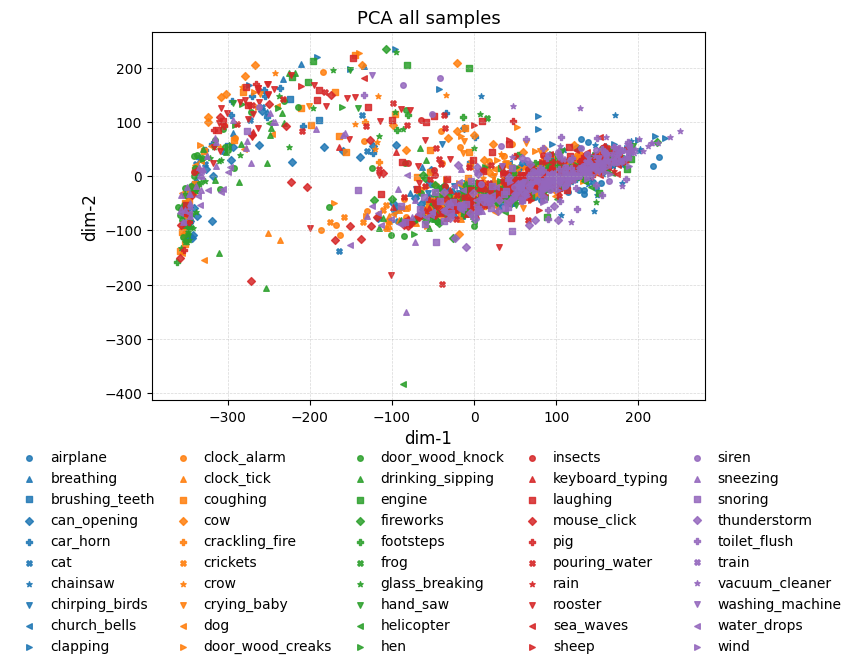

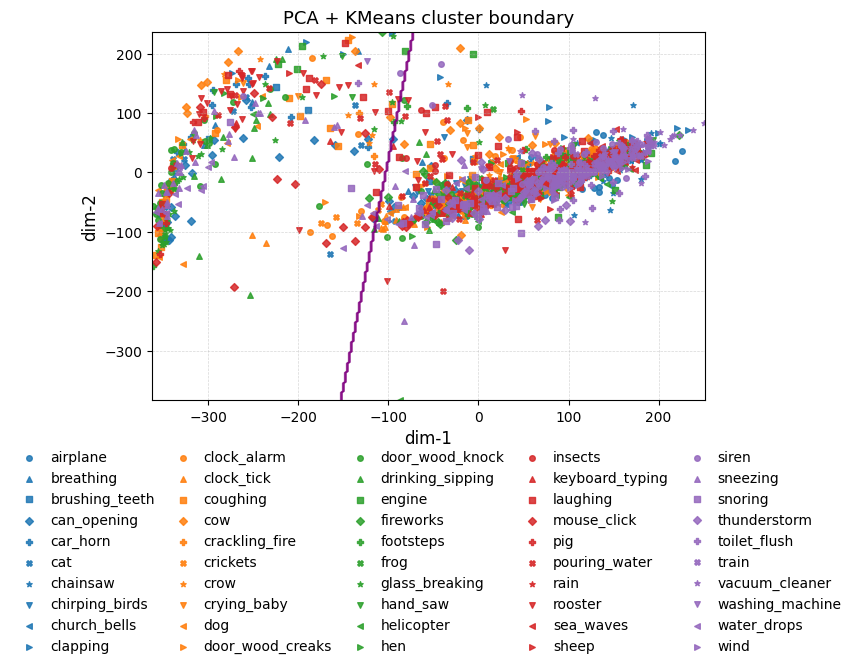

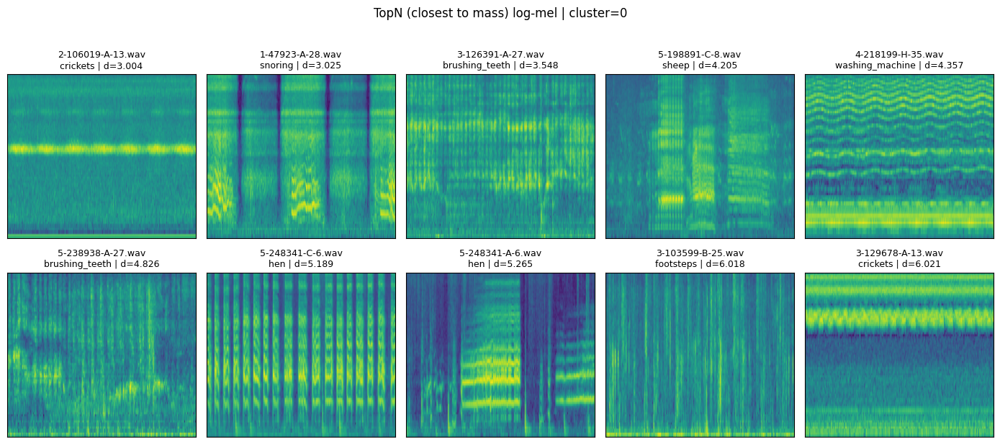

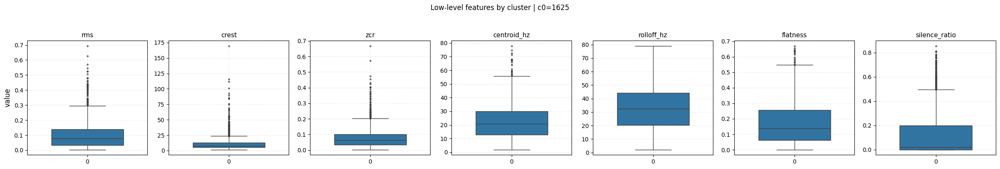

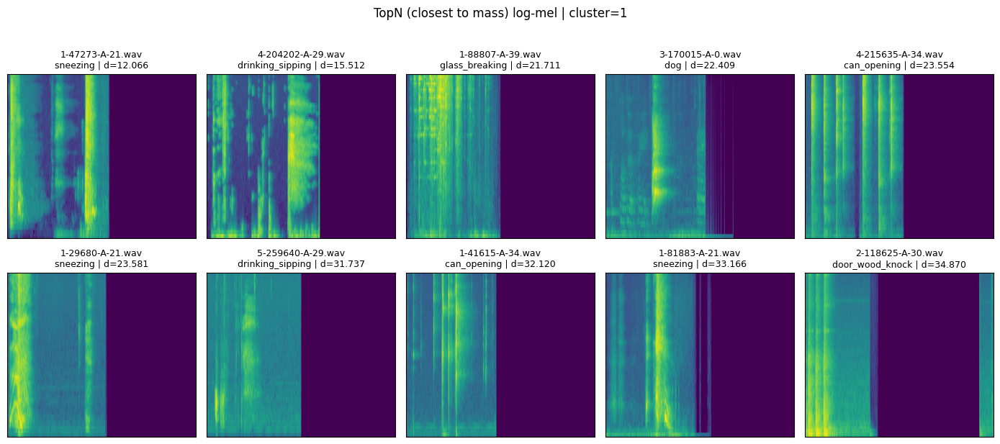

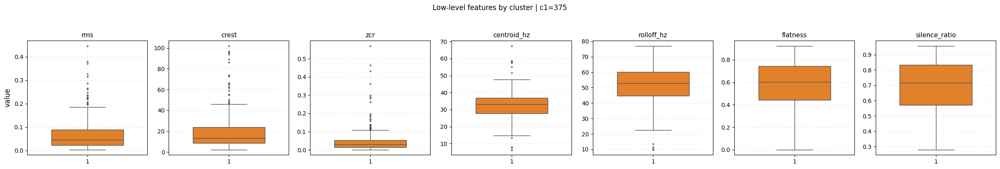

In [16]:
# 跑一个组合（导出所有论文产物）
tag, projector, clusterer, hp = EXPERIMENTS[0]
X2d, out_df, artifacts = run_experiment_once(
    projector=projector,
    clusterer=clusterer,
    latent_df=latent_df,
    X_300d=X_300d,
    y=y,
    # extra_tag=tag,
    temperature=hp.get("temperature", 1.0),
    export_all=True,
    save_file=True
)
out_df.head()


,path,original_label,x,y,cluster,dist_to_mass
0,data/ESC-50-master/audio/1-100032-A-0.wav,dog,-55.036655,-0.827698,1,22.933554
1,data/ESC-50-master/audio/1-100038-A-14.wav,chirping_birds,10.577771,24.059999,0,28.124281
2,data/ESC-50-master/audio/1-100210-A-36.wav,vacuum_cleaner,44.794361,10.377952,0,28.282379
3,data/ESC-50-master/audio/1-100210-B-36.wav,vacuum_cleaner,45.030537,10.376152,0,28.491774
4,data/ESC-50-master/audio/1-101296-A-19.wav,thunderstorm,-4.251324,-26.084862,0,33.531948


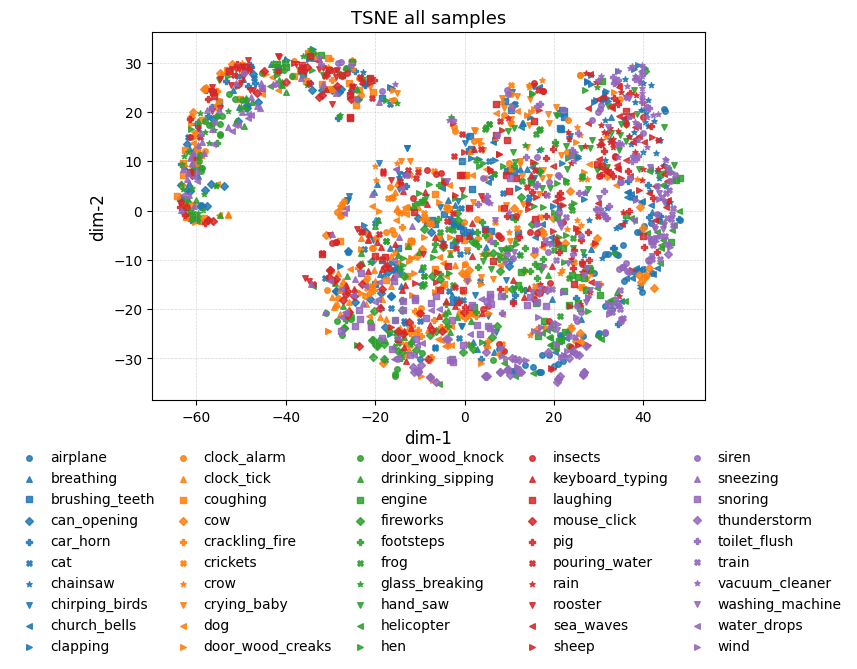

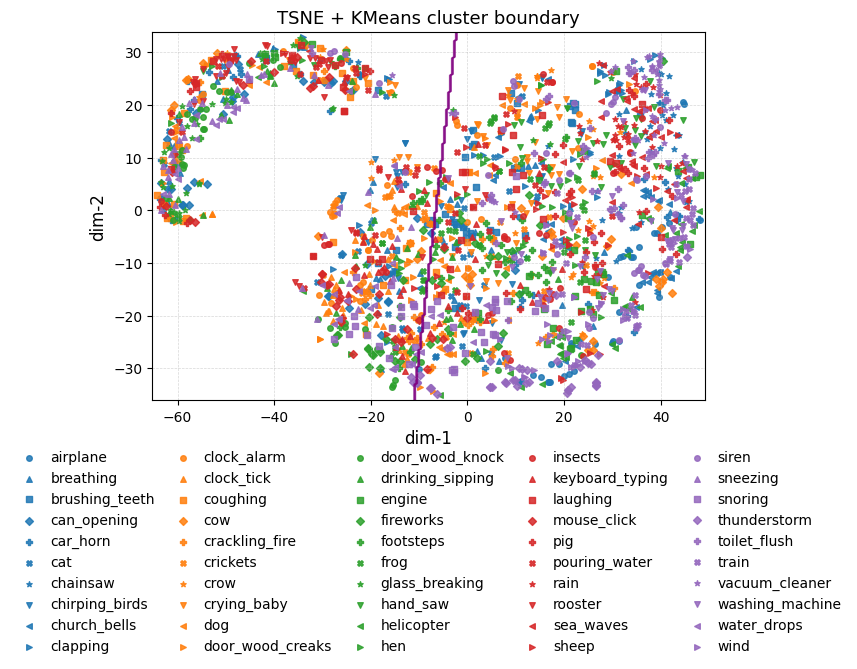

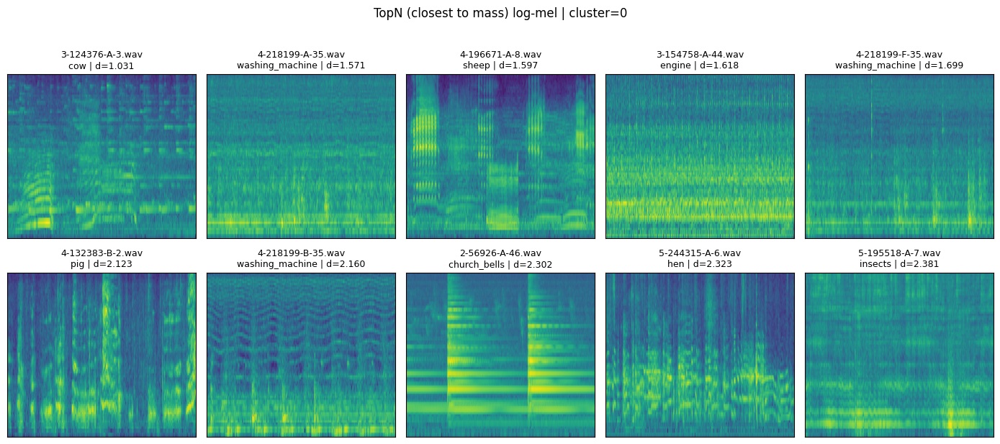

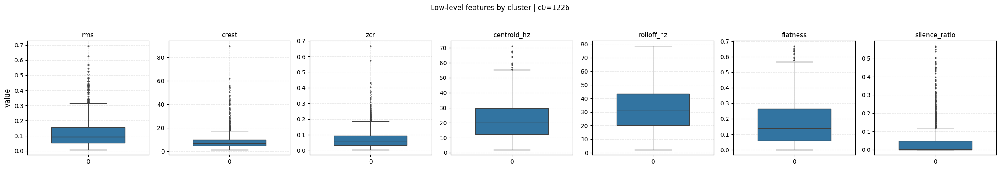

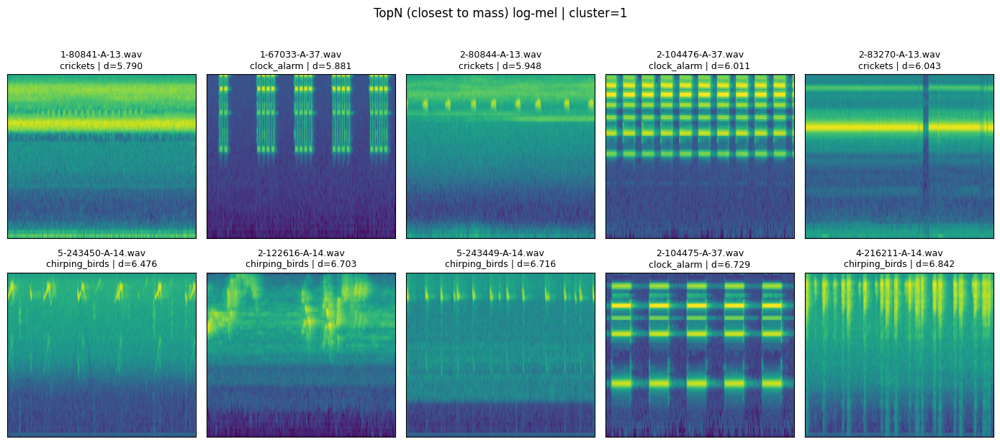

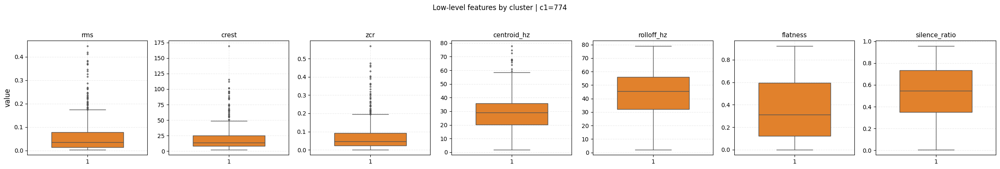

In [17]:
tag, projector, clusterer, hp = EXPERIMENTS[2]
X2d, out_df, artifacts = run_experiment_once(
    projector=projector,
    clusterer=clusterer,
    latent_df=latent_df,
    X_300d=X_300d,
    y=y,
    # extra_tag=tag,
    temperature=hp.get("temperature", 1.0),
    export_all=True,
    save_file=True
)
out_df.head()


In [18]:
# Exploration：试听 TopN（closest to mass）
def listen_topN_by_mass(out_df: pd.DataFrame, n=10, cluster_id=0):
    d = select_topN_by_mass(out_df, cluster_id=cluster_id, n=n, smallest=True)
    for i, r in enumerate(d.itertuples(index=False), 1):
        info = f"[{i}] {Path(r.path).name} | label={r.original_label} | cluster={r.cluster} | d={r.dist_to_mass:.4f}"
        if "confidence" in d.columns and np.isfinite(r.confidence):
            info += f" | conf={r.confidence:.3f}"
        print(info)
        display(Audio(r.path))
    return d

In [19]:
# Alignment（保留原逻辑；normal/noise 缓存命名保持不变）
def check_alignment_metrics(X_normal, X_noise):
    if not np.isfinite(X_normal).all() or not np.isfinite(X_noise).all():
        raise ValueError("输入数据包含 NaN 或 Inf")

    X_normal_c = X_normal - X_normal.mean(axis=0, keepdims=True)
    X_noise_c  = X_noise  - X_noise.mean(axis=0, keepdims=True)

    R, _ = scipy.linalg.orthogonal_procrustes(X_noise_c, X_normal_c)
    X_noise_aligned = X_noise_c @ R

    numerator = np.linalg.norm(X_normal_c - X_noise_aligned, 'fro')
    denominator = np.linalg.norm(X_normal_c, 'fro')
    error_rate = numerator / denominator

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        det_val = scipy.linalg.det(R)
    is_reflection = det_val < 0

    print("--- Alignment Report ---")
    print(f"Result Det : {det_val:.4f}")
    print(f"Symmetry   : {'Reflection (Mirror)' if is_reflection else 'Rotation (Normal)'}")
    print(f"Error Rate : {error_rate:.6f}")

    return det_val, error_rate

def rowwise_cosine(A, B, eps=1e-12):
    An = A / (np.linalg.norm(A, axis=1, keepdims=True) + eps)
    Bn = B / (np.linalg.norm(B, axis=1, keepdims=True) + eps)
    return np.sum(An * Bn, axis=1)

def shuffle_within_label(X, y, seed=0):
    rng = np.random.default_rng(seed)
    Xo = X.copy()
    for lab in np.unique(y):
        idx = np.where(y == lab)[0]
        idx_shuf = idx.copy()
        rng.shuffle(idx_shuf)
        Xo[idx] = Xo[idx_shuf]
    return Xo

def alignment_sanity_check(X_normal, X_noise, y):
    Xn = X_normal - X_normal.mean(axis=0, keepdims=True)
    Xo = X_noise  - X_noise.mean(axis=0, keepdims=True)

    R, _ = scipy.linalg.orthogonal_procrustes(Xo, Xn)
    XoR = Xo @ R
    sim_real = rowwise_cosine(Xn, XoR).mean()

    Xo_shuf = shuffle_within_label(X_noise, y, seed=42)
    Xo_shuf = Xo_shuf - Xo_shuf.mean(axis=0, keepdims=True)
    Xo_shufR = Xo_shuf @ R
    sim_shuf = rowwise_cosine(Xn, Xo_shufR).mean()

    print(f"mean cosine (aligned, real pairing) : {sim_real:.4f}")
    print(f"mean cosine (aligned, within-class shuffled baseline): {sim_shuf:.4f}")
    return sim_real, sim_shuf, R


In [20]:
# Alignment usage（需要 normal 与 noise 两边都跑过 latent 缓存）
X_normal = np.load(ARTIFACT_DIR / "master_all_X.npy")
X_noise  = np.load(ARTIFACT_DIR / "disturbed_latent_all_X.npy")
y_normal = np.load(ARTIFACT_DIR / "master_all_y.npy")

check_alignment_metrics(X_normal, X_noise)
sim_real, sim_shuf, R = alignment_sanity_check(X_normal, X_noise, y_normal)


--- Alignment Report ---
Result Det : 1.0000
Symmetry   : Rotation (Normal)
Error Rate : 0.232818
mean cosine (aligned, real pairing) : 0.9739
mean cosine (aligned, within-class shuffled baseline): 0.4307


In [21]:
_ = listen_topN_by_mass(out_df, n=10, cluster_id=0)

[1] 3-124376-A-3.wav | label=cow | cluster=0 | d=1.0311


[2] 4-218199-A-35.wav | label=washing_machine | cluster=0 | d=1.5711


[3] 4-196671-A-8.wav | label=sheep | cluster=0 | d=1.5972


[4] 3-154758-A-44.wav | label=engine | cluster=0 | d=1.6179


[5] 4-218199-F-35.wav | label=washing_machine | cluster=0 | d=1.6989


[6] 4-132383-B-2.wav | label=pig | cluster=0 | d=2.1226


[7] 4-218199-B-35.wav | label=washing_machine | cluster=0 | d=2.1602


[8] 2-56926-A-46.wav | label=church_bells | cluster=0 | d=2.3018


[9] 5-244315-A-6.wav | label=hen | cluster=0 | d=2.3227


[10] 5-195518-A-7.wav | label=insects | cluster=0 | d=2.3806


In [22]:
_ = listen_topN_by_mass(out_df, n=10, cluster_id=1)

[1] 1-80841-A-13.wav | label=crickets | cluster=1 | d=5.7905


[2] 1-67033-A-37.wav | label=clock_alarm | cluster=1 | d=5.8813


[3] 2-80844-A-13.wav | label=crickets | cluster=1 | d=5.9481


[4] 2-104476-A-37.wav | label=clock_alarm | cluster=1 | d=6.0113


[5] 2-83270-A-13.wav | label=crickets | cluster=1 | d=6.0427


[6] 5-243450-A-14.wav | label=chirping_birds | cluster=1 | d=6.4762


[7] 2-122616-A-14.wav | label=chirping_birds | cluster=1 | d=6.7035


[8] 5-243449-A-14.wav | label=chirping_birds | cluster=1 | d=6.7157


[9] 2-104475-A-37.wav | label=clock_alarm | cluster=1 | d=6.7289


[10] 4-216211-A-14.wav | label=chirping_birds | cluster=1 | d=6.8416
